<a href="https://colab.research.google.com/github/patrick-hanley/thought_experiments/blob/master/_notebooks/2021_02_01_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# "Useful tools for easy explatory data analysis (EDA)"
> "Off the shelf and simple functions for data analysis"


- toc: false
- branch: master
- badges: false
- comments: true
- categories: [data, eda, pandas, pyviz, transform]
- image: images/wine_dataset/correlation.png
- hide: false
- search_exclude: true
- metadata_key1: metadata_value1
- metadata_key2: metadata_value2

#A currated list of useful tools for data analysis.



*   pandas_profile
*   pyviz
*   resumetable
*   feature_transform (my library)



# I will explore the transformations using the [wine data set](https://www.kaggle.com/uciml/red-wine-quality-cortez-et-al-2009) from Kaggle.

In [ ]:
# Standard Library Imports
from pathlib import Path


import pandas as pd
#import numpy as np
#from scipy.stats import kurtosis, skew
from scipy import stats
# import math
# import warnings
# warnings.filterwarnings("error")

from google.colab import drive
mnt=drive.mount('/content/gdrive', force_remount=True)


root_dir = "/content/gdrive/My Drive/"
base_dir = root_dir + 'redwine'
csv_path = (base_dir+'/winequality-red.csv')
df=pd.read_csv(csv_path)

Mounted at /content/gdrive


In [ ]:
# I came across this funtion on Kaggle(I think) and found it incredibly helpful
# https://gist.github.com/harperfu6/5ea565ee23aaf8461a840c480490cd9a

pd.set_option("display.max_rows", 1000)
def resumetable(df):
    print(f'Dataset Shape: {df.shape}')
    summary = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name', 'dtypes']]
    summary['Missing'] = df.isnull().sum().values
    summary['Uniques'] = df.nunique().values
    summary['First Value'] = df.loc[0].values
    summary['Second Value'] = df.loc[1].values
    summary['Third Value'] = df.loc[2].values
    
    for name in summary['Name'].value_counts().index:
        summary.loc[summary['Name'] == name, 'Entropy'] = \
        round(stats.entropy(df[name].value_counts(normalize=True), base=2), 2)
    
    return summary

Typically, the first thing to do is examine the first rows of data, but this just gives you a very rudimentary feel for the data.

In [ ]:
df = pd.read_csv(csv_path) 
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


I found resumetable() to be very convenient.  We get a sense of cardinaltiy from Uniques and we can easily see where we are missing data.  

Also, knowing the datatypes of each column is helpful when in comes to pre-processing the data.

I came across this [funtion](https://gist.github.com/harperfu6/5ea565ee23aaf8461a840c480490cd9a) on Kaggle(I think) and found it incredibly helpful


In [ ]:
resumetable(df)

Dataset Shape: (1599, 12)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,fixed acidity,float64,0,96,7.4000,7.8000,7.800,5.94
1,volatile acidity,float64,0,143,0.7000,0.8800,0.760,6.39
2,citric acid,float64,0,80,0.0000,0.0000,0.040,5.87
3,residual sugar,float64,0,91,1.9000,2.6000,2.300,4.78
4,chlorides,float64,0,153,0.0760,0.0980,0.092,6.22
5,free sulfur dioxide,float64,0,60,11.0000,25.0000,15.000,5.08
6,total sulfur dioxide,float64,0,144,34.0000,67.0000,54.000,6.60
7,density,float64,0,436,0.9978,0.9968,0.997,7.96
8,pH,float64,0,89,3.5100,3.2000,3.260,5.91
9,sulphates,float64,0,96,0.5600,0.6800,0.650,5.73


Another tool I use is [pandas_profiling](https://pandas-profiling.github.io/pandas-profiling/docs/master/rtd/)



In [ ]:
#collapse_output
import sys

!"{sys.executable}" -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension

In [ ]:

from ipywidgets import widgets

# Our package
from pandas_profiling import ProfileReport
from pandas_profiling.utils.cache import cache_file

In [ ]:
profile = ProfileReport(df, title="red wine", html={"style": {"full_width": True}}, sort="None")

Takes a couple minutes to process and display the results even with a small dataset.

You do get some richer analysis like Correlation plots and distributions of the variables.

In [ ]:
# The Notebook Widgets Interface
profile.to_widgets()

/usr/local/lib/python3.6/dist-packages/pandas_profiling/profile_report.py:424: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

An alternative is [Sweetviz]().  I tend to like this a bit better for its display of distributions.  In general, it also loads a bit quicker.

In [ ]:
!pip -q install sweetviz

     |████████████████████████████████| 15.1MB 331kB/s 


                                             |          | [  0%]   00:00 -> (? left)


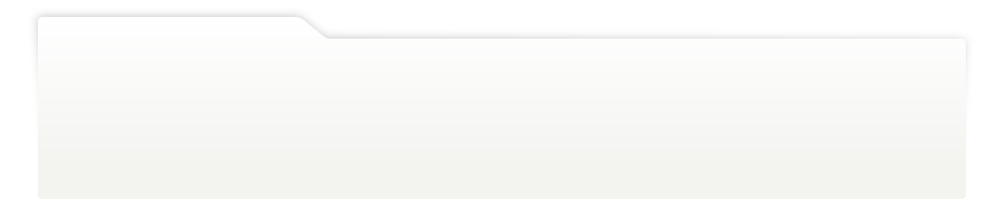
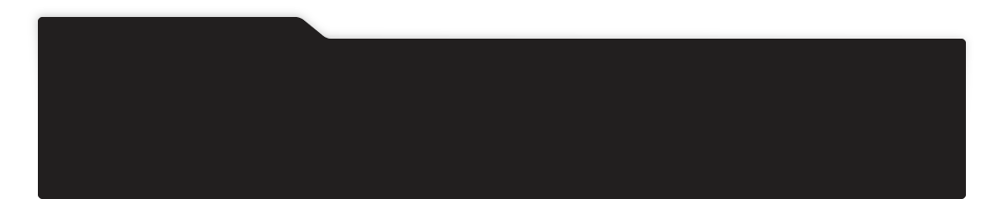
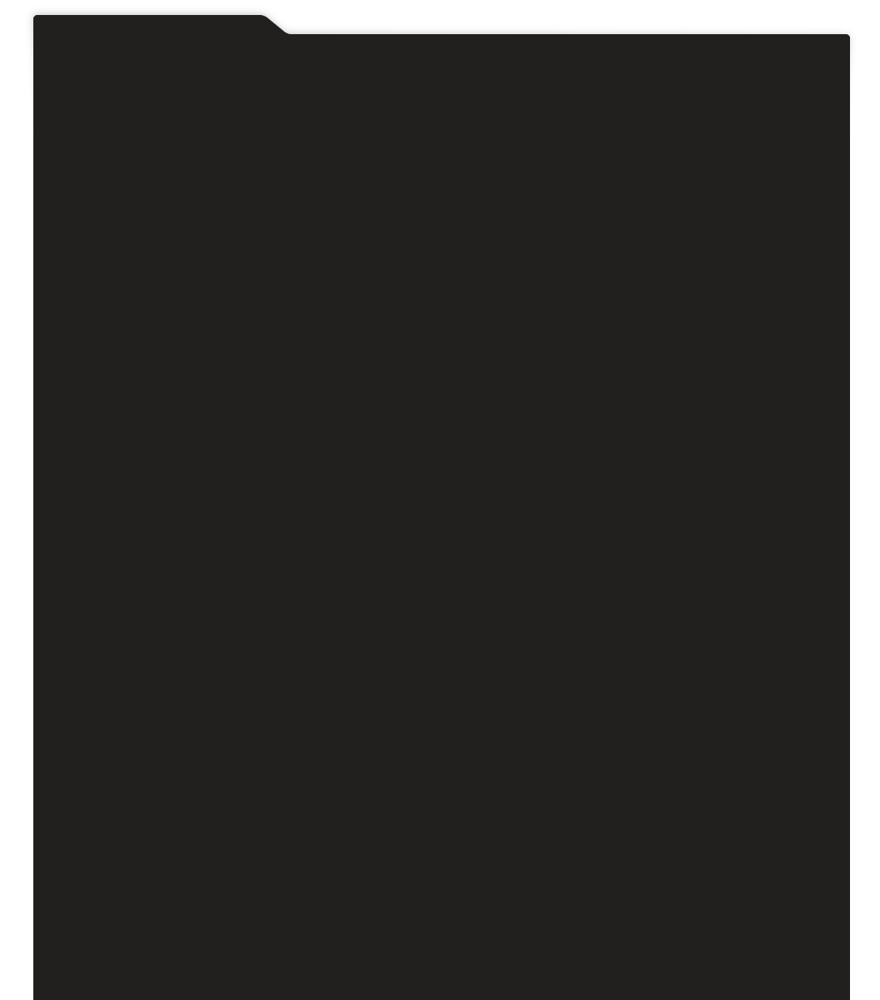
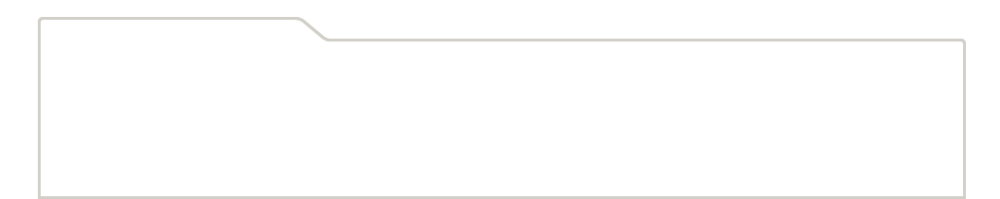
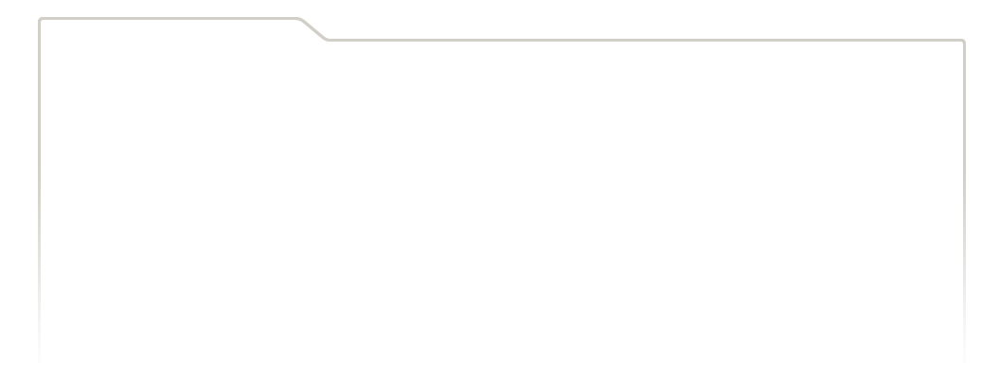
...
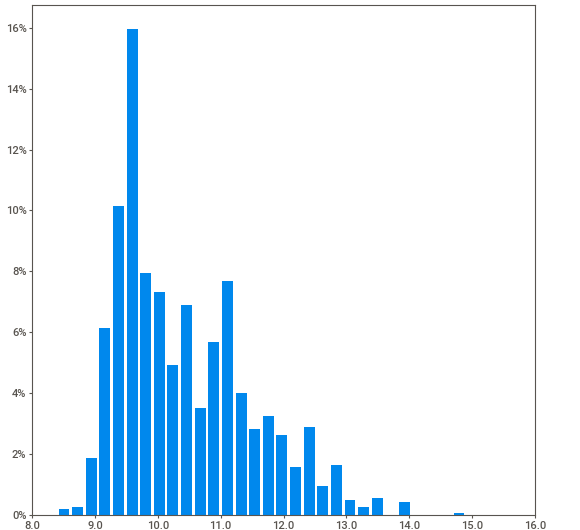
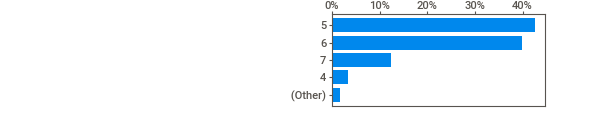
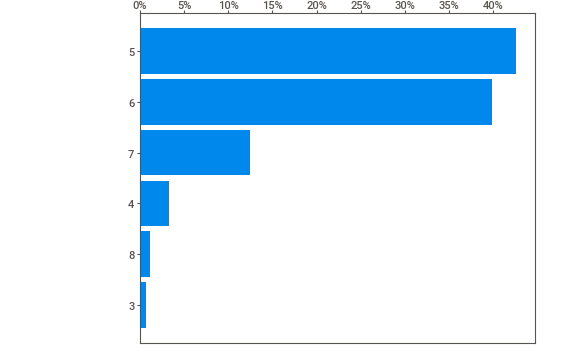
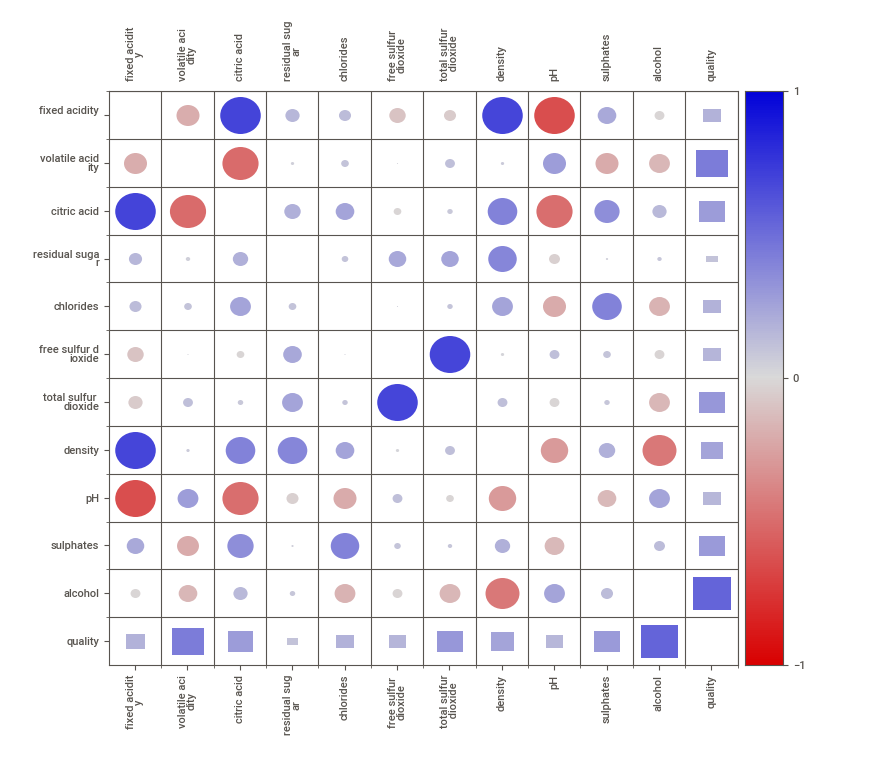
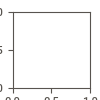

In [ ]:
import sweetviz as sv
sweet_report = sv.analyze(df)
sweet_report.show_notebook(w=1200.)

# My tool for numerical transformations

I wanted a simple way to view the distributions of the features and more importantly a way to view the data after numerical transformations such as Box-Cox or a log transform.



The following plot is a sample of what I developed.
The first plot is the input and the next plots show the various transformations along with their skew and kurtosis.  What is highlighted in pink is the transform that was automatically selected to yield the most gausian distribution.



#[](https://)![Numerical transfors]({{ site.url }}{{ site.baseurl }}/images/wine_dataset/quantile_transform.png)

See this 
#[Post](https://patrick-hanley.github.io/thought_experiments/data/eda/pandas/pyviz/transform/2021/02/22/_02_01_eda.html) for more detail.

